In [1]:
import time

import pandas as pd  
import numpy as np

from torch.autograd import Variable
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split, SubsetRandomSampler, WeightedRandomSampler
import torch.utils.data as data_utils

from pytorch_focalloss import *

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from scipy import stats

import matplotlib.pyplot as plt
import seaborn as sns 
from pylab import rcParams

from sklearn.metrics import (confusion_matrix, precision_recall_curve, auc,
                             roc_curve, recall_score, classification_report, f1_score,
                             precision_recall_fscore_support)

import shap
import lime
from lime import submodular_pick

sns.set(style='whitegrid', palette='muted', font_scale=1.5)

plt.rcParams['figure.figsize'] = 14, 8

RANDOM_SEED = 42
LABELS = ["N", "Y"]

In [2]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [3]:
## train data
class trainData(Dataset):
    
    def __init__(self, X_data, y_data):
        self.X_data = X_data
        self.y_data = y_data
        
    def __getitem__(self, index):
        return self.X_data[index], self.y_data[index]
        
    def __len__ (self):
        return len(self.X_data)

In [4]:
## test data    
class testData(Dataset):
    
    def __init__(self, X_data):
        self.X_data = X_data
        
    def __getitem__(self, index):
        return self.X_data[index]
        
    def __len__ (self):
        return len(self.X_data)

In [5]:
def binary_acc(y_pred, y_test):
    y_pred_tag = torch.round(torch.sigmoid(y_pred))

    correct_results_sum = (y_pred_tag == y_test).sum().float()
    # correct_results_sum = (y_pred_tag == y_test).sum()
    correct_results_sum = torch.FloatTensor(correct_results_sum)
    
    acc = correct_results_sum/y_test.shape[0]
    acc = torch.round(acc * 100)
    
    return acc

In [6]:
df = pd.read_csv('/Users/wbchoi/PycharmProjects/ai_projects/C_ITS/prediction_modeling/full_data_kma_hours_lightgbm_feature_extract.csv')

In [7]:
df.head()

,SUB_YN,ROAD_TYPE,REST_VEH,MAX_SPD,LANES,CW_YN,BUS_YN,A3_ROADTYPE_1_YN,A1_LANE_04_YN,A1_BARR_03_YN,...,A1_BARR_03_CNT,A1_BARR_02_CNT,topis_22_07,pop_22_07,WS,WD,TEMP,RF,HM,SAGO_YN
0,0,0,0,60.0,5.0,1,1,0,0,0,...,0.0,0.0,0.250954,0.024952,0.064220,0.943889,0.419935,0.0,0.727227,0
1,0,0,0,60.0,5.0,1,1,0,0,0,...,0.0,0.0,0.250954,0.024952,0.146789,0.911667,0.418301,0.0,0.707207,0
2,0,0,0,60.0,5.0,1,1,0,0,0,...,0.0,0.0,0.250954,0.024952,0.100917,0.956667,0.410131,0.0,0.755255,0
3,0,0,0,60.0,5.0,1,1,0,0,0,...,0.0,0.0,0.250954,0.024952,0.100917,0.963611,0.410131,0.0,0.764765,0
4,0,0,0,60.0,5.0,1,1,0,0,0,...,0.0,0.0,0.250954,0.024952,0.128440,0.973333,0.405229,0.0,0.775275,0


In [8]:
X = df.iloc[:, 0:-1]
y = df.iloc[:, -1]

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RANDOM_SEED)

In [ ]:
y_train_create = pd.DataFrame(y_train)

In [ ]:
y_train_create.columns = ['SAGO_YN']
sago_x_weight = y_train_create[y_train_create['SAGO_YN'] == 0]
sago_y_weight = y_train_create[y_train_create['SAGO_YN'] == 1]

In [ ]:
weight_ratio = len(sago_x_weight) / len(sago_y_weight)
weight_ratio = round(weight_ratio, 1)
weight_ratio

4203.3

In [ ]:
num_epochs = 20
batch_size = 1024
weight_decay = 10e-4
lr_gamma = 0.1
step_size = 10
lr = 10e-5

In [ ]:
train_data = trainData(torch.FloatTensor(X_train.values), 
                       torch.FloatTensor(y_train.values))

test_data = testData(torch.FloatTensor(X_test.values))

In [ ]:
train_loader = data_utils.DataLoader(train_data, batch_size=batch_size, shuffle=True, num_workers = 6)
test_loader = data_utils.DataLoader(test_data, batch_size=1, shuffle=False)

In [ ]:
'''class DNN(nn.Module):
    def __init__(self):
        super(DNN, self).__init__()
        # Number of input features is 36.
        self.layer_1 = nn.Linear(36, 64) 
        self.layer_2 = nn.Linear(64, 64)
        self.layer_3 = nn.Linear(64, 64)
        self.layer_4 = nn.Linear(64, 64)
        self.layer_out = nn.Linear(64, 1) 
        
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(p=0.2)
        self.batchnorm1 = nn.BatchNorm1d(64)
        self.batchnorm2 = nn.BatchNorm1d(64)
        self.batchnorm3 = nn.BatchNorm1d(64)
        self.batchnorm4 = nn.BatchNorm1d(64)

        
    def forward(self, inputs):
        x = self.relu(self.layer_1(inputs))
        x = self.batchnorm1(x)
        
        x = self.relu(self.layer_2(x))
        x = self.dropout(x)
        x = self.batchnorm2(x)
        
        x = self.relu(self.layer_3(x))
        x = self.dropout(x)
        x = self.batchnorm3(x)
        
        x = self.relu(self.layer_4(x))
        x = self.dropout(x)
        x = self.batchnorm4(x)
        
        x = self.layer_out(x)
        
        return x'''

'class DNN(nn.Module):\n    def __init__(self):\n        super(DNN, self).__init__()\n        # Number of input features is 36.\n        self.layer_1 = nn.Linear(36, 64) \n        self.layer_2 = nn.Linear(64, 64)\n        self.layer_3 = nn.Linear(64, 64)\n        self.layer_4 = nn.Linear(64, 64)\n        self.layer_out = nn.Linear(64, 1) \n        \n        self.relu = nn.ReLU()\n        self.dropout = nn.Dropout(p=0.2)\n        self.batchnorm1 = nn.BatchNorm1d(64)\n        self.batchnorm2 = nn.BatchNorm1d(64)\n        self.batchnorm3 = nn.BatchNorm1d(64)\n        self.batchnorm4 = nn.BatchNorm1d(64)\n\n        \n    def forward(self, inputs):\n        x = self.relu(self.layer_1(inputs))\n        x = self.batchnorm1(x)\n        \n        x = self.relu(self.layer_2(x))\n        x = self.dropout(x)\n        x = self.batchnorm2(x)\n        \n        x = self.relu(self.layer_3(x))\n        x = self.dropout(x)\n        x = self.batchnorm3(x)\n        \n        x = self.relu(self.layer_4(x))

In [ ]:
# Model definition
model = nn.Sequential(nn.Linear(X_train.shape[1], 64),
                      nn.ReLU(),
                      nn.BatchNorm1d(64),
                      
                      nn.Linear(64, 64),
                      nn.ReLU(),
                      nn.Dropout(p=0.2),
                      nn.BatchNorm1d(64),
                      
                      nn.Linear(64, 64),
                      nn.ReLU(),
                      nn.Dropout(p=0.2),
                      nn.BatchNorm1d(64),
                      
                      nn.Linear(64, 64),
                      nn.ReLU(),
                      nn.Dropout(p=0.2),
                      nn.BatchNorm1d(64),
                      
                      nn.Linear(64, 1)
                     )

In [ ]:
'''double() : torch.float32'''
# model = DNN()
model = model.to(device)

'''교통사고 X / 교통사고 Y => 클래스 균행 샘플링'''
# BCE Wiwh Logits Loss
# class_weight = torch.FloatTensor([weight_ratio])

# Focal Loss
# alpha = 1.0 / weight_ratio # 클래스 별 가중치
alpha = 0.25 # 클래스 별 가중치
print(alpha)
fl_gamma = 2

# criterion = nn.BCEWithLogitsLoss(pos_weight = class_weight, reduction = 'mean')
criterion = FocalLoss(alpha=alpha, gamma=fl_gamma)

# optimizer = torch.optim.AdamW(
#        model.parameters(), lr=lr, weight_decay=weight_decay)

optimizer = torch.optim.Adam(
        model.parameters(), lr=lr, weight_decay=weight_decay)

scheduler = torch.optim.lr_scheduler.StepLR(optimizer, gamma=lr_gamma, step_size=step_size, last_epoch=-1)

0.25


In [ ]:
model.train()

Sequential(
  (0): Linear(in_features=36, out_features=64, bias=True)
  (1): ReLU()
  (2): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (3): Linear(in_features=64, out_features=64, bias=True)
  (4): ReLU()
  (5): Dropout(p=0.2, inplace=False)
  (6): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (7): Linear(in_features=64, out_features=64, bias=True)
  (8): ReLU()
  (9): Dropout(p=0.2, inplace=False)
  (10): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (11): Linear(in_features=64, out_features=64, bias=True)
  (12): ReLU()
  (13): Dropout(p=0.2, inplace=False)
  (14): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (15): Linear(in_features=64, out_features=1, bias=True)
)

In [ ]:
'''train the model'''

for e in range(1, num_epochs+1):
    epoch_loss = 0
    for X_batch, y_batch in train_loader:
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)
        optimizer.zero_grad()
        
        y_pred = model(X_batch)
        # print(X_batch.shape)
        # print(y_pred.shape)
        
        loss = criterion(y_pred, y_batch.unsqueeze(1)) 

        loss.backward()
        optimizer.step()
        
        epoch_loss += loss.item()        
    # learning rate decay
    scheduler.step()
        
    print(f'Epoch {e+0:03}: | Loss: {epoch_loss/len(train_loader):.5f}')

In [ ]:
'''torch.save({
            'epoch': e,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scheduler': scheduler.state_dict(),
            'loss': loss
            }, 'pytorch_DNN_model/pytorch_model_epoch_20.pkl')'''

In [20]:
step_size = 1

In [21]:
# model = DNN()
model = model.to(device)

criterion = nn.BCEWithLogitsLoss(pos_weight = class_weight, reduction = 'mean')

optimizer = torch.optim.AdamW(
        model.parameters(), lr=lr, weight_decay=weight_decay)

scheduler = torch.optim.lr_scheduler.StepLR(optimizer, gamma=gamma, step_size=step_size, last_epoch=-1)

In [22]:
checkpoint = torch.load('pytorch_DNN_model/pytorch_model_epoch_20.pkl')
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
scheduler.load_state_dict(checkpoint['scheduler'])
epoch = checkpoint['epoch']
loss = checkpoint['loss']

In [23]:
1

1

In [26]:
'''train the model'''

'''model.train()

for e in range(1, num_epochs+1):
    epoch_loss = 0
    for X_batch, y_batch in train_loader:
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)
        optimizer.zero_grad()
        
        y_pred = model(X_batch)
        # print(X_batch.shape)
        # print(y_pred.shape)
        
        loss = criterion(y_pred, y_batch.unsqueeze(1))        
        loss.backward()
        optimizer.step()
        
        epoch_loss += loss.item()        
    # learning rate decay
    scheduler.step()
        
    print(f'Epoch {e+0:03}: | Loss: {epoch_loss/len(train_loader):.5f}')'''

Epoch 001: | Loss: 1.01107
Epoch 002: | Loss: 1.01286
Epoch 003: | Loss: 1.00985
Epoch 004: | Loss: 1.00771
Epoch 005: | Loss: 1.01227
Epoch 006: | Loss: 1.00518
Epoch 007: | Loss: 1.00747
Epoch 008: | Loss: 1.01051
Epoch 009: | Loss: 1.01081
Epoch 010: | Loss: 1.00634
Epoch 011: | Loss: 1.00676
Epoch 012: | Loss: 1.00687
Epoch 013: | Loss: 1.00887
Epoch 014: | Loss: 1.00807
Epoch 015: | Loss: 1.00556
Epoch 016: | Loss: 1.00561
Epoch 017: | Loss: 1.01008
Epoch 018: | Loss: 1.00661
Epoch 019: | Loss: 1.00955
Epoch 020: | Loss: 1.00470


In [27]:
'''torch.save({
            'epoch': e,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scheduler': scheduler.state_dict(),
            'loss': loss
            }, 'pytorch_DNN_model/pytorch_model_epoch_40.pkl')'''

In [24]:
# model = DNN()
model = model.to(device)

criterion = nn.BCEWithLogitsLoss(pos_weight = class_weight, reduction = 'mean')

optimizer = torch.optim.AdamW(
        model.parameters(), lr=lr, weight_decay=weight_decay)

scheduler = torch.optim.lr_scheduler.StepLR(optimizer, gamma=gamma, step_size=step_size, last_epoch=-1)

In [25]:
checkpoint = torch.load('pytorch_DNN_model/pytorch_model_epoch_40.pkl')
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
scheduler.load_state_dict(checkpoint['scheduler'])
epoch = checkpoint['epoch']
loss = checkpoint['loss']

In [41]:
y_pred_list = []
model.eval()

Sequential(
  (0): Linear(in_features=36, out_features=64, bias=True)
  (1): ReLU()
  (2): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (3): Linear(in_features=64, out_features=64, bias=True)
  (4): ReLU()
  (5): Dropout(p=0.2, inplace=False)
  (6): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (7): Linear(in_features=64, out_features=64, bias=True)
  (8): ReLU()
  (9): Dropout(p=0.2, inplace=False)
  (10): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (11): Linear(in_features=64, out_features=64, bias=True)
  (12): ReLU()
  (13): Dropout(p=0.2, inplace=False)
  (14): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (15): Linear(in_features=64, out_features=1, bias=True)
)

In [31]:
with torch.no_grad():
    for X_batch in test_loader:
        X_batch = X_batch.to(device)
        y_test_pred = model(X_batch)
        y_test_pred = torch.sigmoid(y_test_pred)
        y_pred_tag = torch.round(y_test_pred)        
        y_pred_list.append(y_pred_tag.cpu().numpy())
        
y_pred_list = [a.squeeze().tolist() for a in y_pred_list]

In [32]:
cm = confusion_matrix(y_test, y_pred_list)
print(cm)

[[2330671  828110]
 [    200     545]]


In [33]:
print(classification_report(y_test, y_pred_list))

              precision    recall  f1-score   support

           0       1.00      0.74      0.85   3158781
           1       0.00      0.73      0.00       745

    accuracy                           0.74   3159526
   macro avg       0.50      0.73      0.43   3159526
weighted avg       1.00      0.74      0.85   3159526



In [34]:
tp = cm[1,1]
tn = cm[0,0]
fp = cm[0,1]
fn = cm[1,0]

acc = (tp + tn) / (tp + tn + fp + fn)
prec = tp / (tp+fp)
rec = tp / (tp+fn)
spec = tn / (fp + tn)

print('정확도 (Accuracy): %f , 정밀도 (Precision): %f , 재현율 (Recall): %f , 특이도 (Specificity): %f' % (acc, prec, rec, spec))

정확도 (Accuracy): 0.737837 , 정밀도 (Precision): 0.000658 , 재현율 (Recall): 0.731544 , 특이도 (Specificity): 0.737839


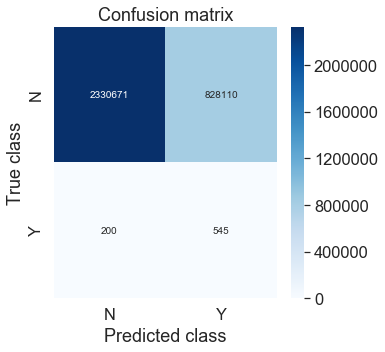

In [35]:
plt.figure(figsize=(5,5))
sns.heatmap(cm, xticklabels=LABELS, yticklabels=LABELS, annot=True, fmt="d", 
            cmap=plt.cm.get_cmap('Blues'));
plt.title("Confusion matrix")
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.show()

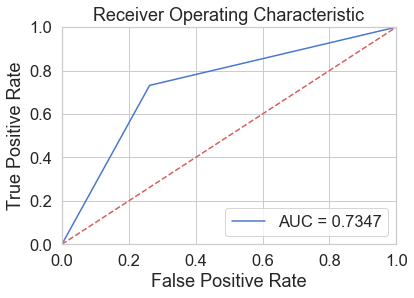

In [36]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_list)
roc_auc = auc(fpr, tpr)

plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, label='AUC = %0.4f'% roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.001, 1])
plt.ylim([0, 1.001])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show();

# Deep Explainer

In [42]:
X_train_np = X_train.values
X_test_np = X_test.values

train_data_samples = torch.from_numpy(X_train_np[np.random.choice(np.arange(len(X_train)), 10000, replace = False)]).to(device)
test_data_samples = torch.from_numpy(X_test_np[np.random.choice(np.arange(len(X_test)), 5000, replace = False)]).to(device)

In [43]:
X_train_10000 = X_train.sample(10000)
X_test_5000 = X_test.sample(5000)

In [44]:
'''
X_test 전체 데이터 아닌 500개 랜덤 추출 데이터셋 사용.
shape values 추출을 위해 시간 오래 걸림
'''
explainer_shap = shap.DeepExplainer(model.double(), train_data_samples)

start = time.time()
shap_values = explainer_shap.shap_values(test_data_samples) 
end = time.time()

shap_time = end - start 
print('shap values 추출 소요 시간 : %.3f' %(shap_time))

# 5000개 랜덤 추출 시간: 약 1시간 20분 
# 10000개 랜덤 추출 시간: 약 2시간 10분 이상 소요 (강제 중단)

shap values 추출 소요 시간 : 4936.645


In [45]:
df = pd.DataFrame({
    "mean_abs_shap": np.mean(np.abs(shap_values), axis=0), 
    "stdev_abs_shap": np.std(np.abs(shap_values), axis=0), 
    "name": X_test.columns
})

df.sort_values("mean_abs_shap", ascending=False)[:20]

,mean_abs_shap,stdev_abs_shap,name
7,0.450920,0.150532,A3_ROADTYPE_1_YN
4,0.351662,0.300009,LANES
20,0.199961,0.143552,BUS_CNT
3,0.180025,0.235764,MAX_SPD
8,0.163348,0.099085,A1_LANE_04_YN
35,0.145032,0.098913,HM
17,0.119313,0.116280,NODE_LANES_CNT
19,0.104226,0.091528,CW_CNT
2,0.101560,0.286438,REST_VEH
33,0.097792,0.064495,TEMP


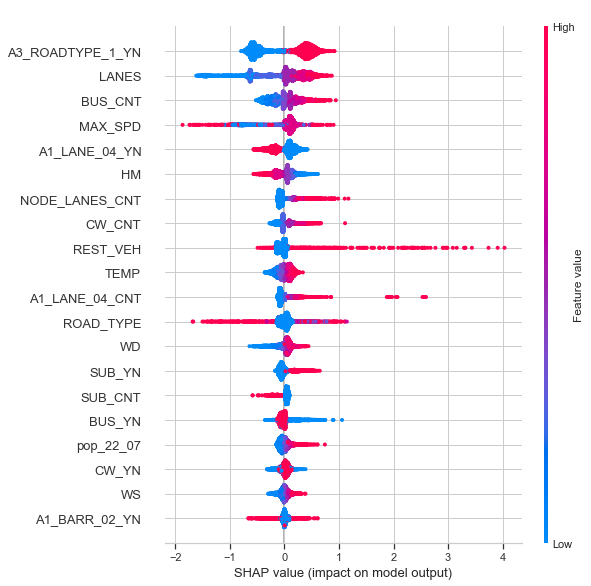

In [54]:
shap.summary_plot(shap_values, features=test_data_samples, feature_names=X_test.columns)

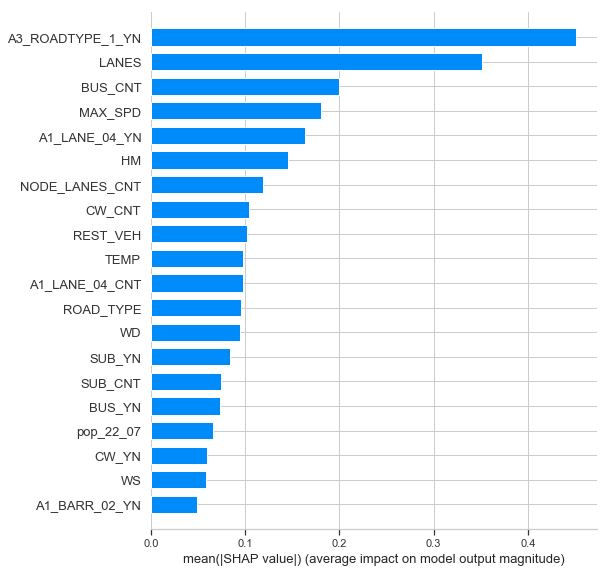

In [55]:
shap.summary_plot(shap_values, features=test_data_samples, feature_names=X_test.columns, plot_type="bar")

In [48]:
# visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
shap.initjs()

In [49]:
shap.force_plot(explainer_shap.expected_value, shap_values[0,:], X_test_5000.iloc[0,:], link = 'logit')

# shap.force_plot(explainer_shap.expected_value,
#                shap_values,
#                feature_names=X_test.columns)

In [50]:
# visualize the training set predictions
shap.force_plot(explainer_shap.expected_value, shap_values, X_test_5000, link = 'logit')

shap.force_plot is slow for many thousands of rows, try subsampling your data.


In [51]:
X_test.columns

Index(['SUB_YN', 'ROAD_TYPE', 'REST_VEH', 'MAX_SPD', 'LANES', 'CW_YN',
       'BUS_YN', 'A3_ROADTYPE_1_YN', 'A1_LANE_04_YN', 'A1_BARR_03_YN',
       'A1_BARR_02_YN', 'S_P_UTERNX_CNT', 'SN_P_HDUFID_CNT', 'SF_P_ALL_CNT',
       'SF_PL_CW_CNT', 'SF_L_1_CNT', 'SUB_CNT', 'NODE_LANES_CNT',
       'NODE_INTERS_CNT', 'CW_CNT', 'BUS_CNT', 'A3_ROADTYPE_3_CNT',
       'A3_ROADTYPE_1_CNT', 'A2_STOP_2_CNT', 'A2_STOP_1_CNT', 'A1_LANE_04_CNT',
       'A1_BARR_05_CNT', 'A1_BARR_03_CNT', 'A1_BARR_02_CNT', 'topis_22_07',
       'pop_22_07', 'WS', 'WD', 'TEMP', 'RF', 'HM'],
      dtype='object')

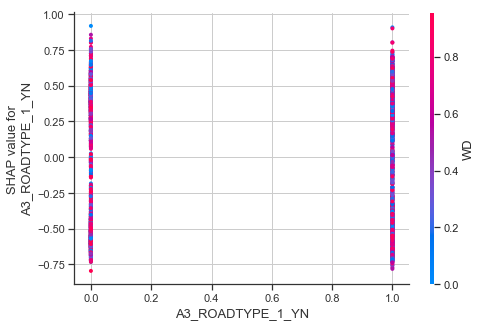

In [56]:
shap.dependence_plot(7, shap_values, X_test_5000)

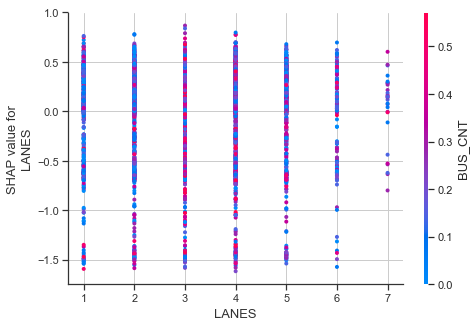

In [57]:
shap.dependence_plot(4, shap_values, X_test_5000)

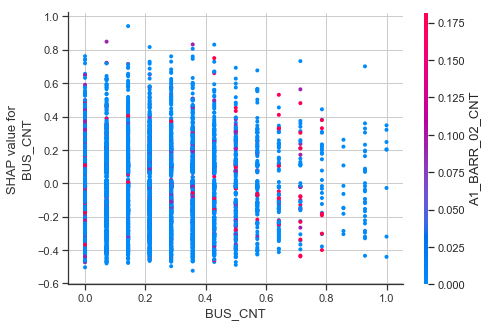

In [58]:
shap.dependence_plot(20, shap_values, X_test_5000)

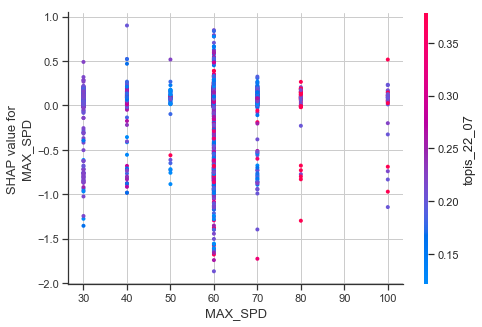

In [59]:
shap.dependence_plot(3, shap_values, X_test_5000)

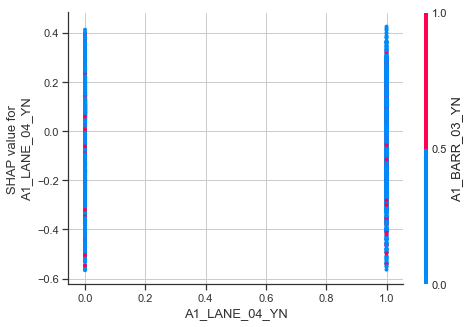

In [60]:
shap.dependence_plot(8, shap_values, X_test_5000)

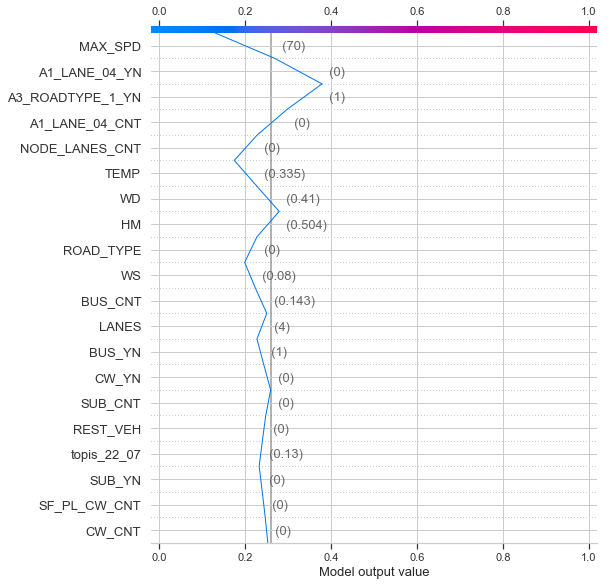

In [37]:
# link = 'logit' 을 추가 할 경우, 모델의 출력 값을 [0,1] 로 변환.
shap.decision_plot(explainer_shap.expected_value,
                   shap_values[0, :],
                   X_test_5000.iloc[0, :],
                   ignore_warnings = True,
                   link = 'logit',
                   feature_names=X_test.columns.tolist()
                  )

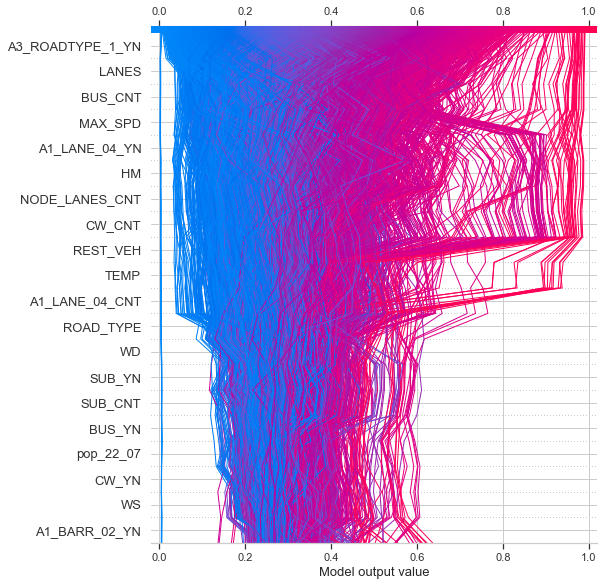

In [53]:
# link = 'logit' 을 추가 할 경우, 모델의 출력 값을 [0,1] 로 변환.
shap.decision_plot(explainer_shap.expected_value,
                   shap_values,
                   X_test_5000,
                   ignore_warnings = True,
                   link = 'logit',
                   feature_names=X_test.columns.tolist()
                  )